### GROUP: 07 
### NISHITA MATLANI 
### DHIR THACKER 

In [1]:
#import libraries
import numpy as np
import pandas as pd

import scipy.stats as stats
import statsmodels.api as sm

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly as py
import plotly.express as px

from plotly.subplots import make_subplots
import plotly.graph_objs as go

sns.set_theme(style='darkgrid')

### Data Cleaning and Preprocessing
The initial phase of the project involved an extensive data cleaning and preprocessing stage, pivotal for ensuring the integrity and reliability of the analysis. This stage included systematic processing of various datasets such as sales data, store information, transaction records, oil prices, and holidaydata.


In [2]:
df_train = pd.read_csv("Files/train.csv")
df_test = pd.read_csv("Files/test.csv")
df_holiday = pd.read_csv("Files/holidays_events.csv")
df_oil = pd.read_csv("Files/oil.csv")
df_stores = pd.read_csv("Files/stores.csv")
df_transactions = pd.read_csv("Files/transactions.csv")

In [3]:
df_train.head(10)


,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0
5,5,2013-01-01,1,BREAD/BAKERY,0.0,0
6,6,2013-01-01,1,CELEBRATION,0.0,0
7,7,2013-01-01,1,CLEANING,0.0,0
8,8,2013-01-01,1,DAIRY,0.0,0
9,9,2013-01-01,1,DELI,0.0,0


In [4]:
df_test.head(10)

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0
5,3000893,2017-08-16,1,BREAD/BAKERY,12
6,3000894,2017-08-16,1,CELEBRATION,0
7,3000895,2017-08-16,1,CLEANING,25
8,3000896,2017-08-16,1,DAIRY,45
9,3000897,2017-08-16,1,DELI,18


In [5]:
df_holiday.head(10)

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
6,2012-06-23,Holiday,Local,Guaranda,Cantonizacion de Guaranda,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
8,2012-06-25,Holiday,Local,Latacunga,Cantonizacion de Latacunga,False
9,2012-06-25,Holiday,Local,Machala,Fundacion de Machala,False


In [6]:
df_oil.head(10)

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
5,2013-01-08,93.21
6,2013-01-09,93.08
7,2013-01-10,93.81
8,2013-01-11,93.60
9,2013-01-14,94.27


In [7]:
df_stores.head(10)

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [8]:
df_transactions.head(10)

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
5,2013-01-02,5,1903
6,2013-01-02,6,2143
7,2013-01-02,7,1874
8,2013-01-02,8,3250
9,2013-01-02,9,2940


#### check_data function analyzes DataFrame df, extracting key statistics for each column like data type, non-null count, unique values, null count, and duplicate row count.

#### It compiles this information into a concise DataFrame summary, df_check, enabling quick examination and assessment of the dataset's integrit




In [9]:
def check_data(df):

    summary = [
        [col, df[col].dtype, df[col].count(), df[col].nunique(), df[col].isnull().sum(), df.duplicated().sum()]
        for col in df.columns
    ]

    # Create a DataFrame from the list of lists
    df_check = pd.DataFrame(summary, columns=["column", "dtype", "instances", "unique", "sum_null", "duplicates"])

    return df_check

In [10]:
summary_train = [
    [col, df_train[col].dtype, df_train[col].count(), df_train[col].nunique(), df_train[col].isnull().sum(), df_train.duplicated().sum()]
    for col in df_train.columns
]
df_check_train = pd.DataFrame(summary_train, columns=["column", "dtype", "instances", "unique", "sum_null", "duplicates"])
df_check_train


,column,dtype,instances,unique,sum_null,duplicates
0,id,int64,3000888,3000888,0,0
1,date,object,3000888,1684,0,0
2,store_nbr,int64,3000888,54,0,0
3,family,object,3000888,33,0,0
4,sales,float64,3000888,379610,0,0
5,onpromotion,int64,3000888,362,0,0


In [11]:
summary_test = [
    [col, df_test[col].dtype, df_test[col].count(), df_test[col].nunique(), df_test[col].isnull().sum(), df_test.duplicated().sum()]
    for col in df_test.columns
]
df_check_test = pd.DataFrame(summary_test, columns=["column", "dtype", "instances", "unique", "sum_null", "duplicates"])
df_check_test


,column,dtype,instances,unique,sum_null,duplicates
0,id,int64,28512,28512,0,0
1,date,object,28512,16,0,0
2,store_nbr,int64,28512,54,0,0
3,family,object,28512,33,0,0
4,onpromotion,int64,28512,212,0,0


In [12]:
summary_holiday = [
    [col, df_holiday[col].dtype, df_holiday[col].count(), df_holiday[col].nunique(), df_holiday[col].isnull().sum(), df_holiday.duplicated().sum()]
    for col in df_holiday.columns
]
df_check_holiday = pd.DataFrame(summary_holiday, columns=["column", "dtype", "instances", "unique", "sum_null", "duplicates"])
df_check_holiday


,column,dtype,instances,unique,sum_null,duplicates
0,date,object,350,312,0,0
1,type,object,350,6,0,0
2,locale,object,350,3,0,0
3,locale_name,object,350,24,0,0
4,description,object,350,103,0,0
5,transferred,bool,350,2,0,0


In [13]:
summary_oil = [
    [col, df_oil[col].dtype, df_oil[col].count(), df_oil[col].nunique(), df_oil[col].isnull().sum(), df_oil.duplicated().sum()]
    for col in df_oil.columns
]
df_check_oil = pd.DataFrame(summary_oil, columns=["column", "dtype", "instances", "unique", "sum_null", "duplicates"])
df_check_oil


,column,dtype,instances,unique,sum_null,duplicates
0,date,object,1218,1218,0,0
1,dcoilwtico,float64,1175,998,43,0


In [14]:
summary_stores = [
    [col, df_stores[col].dtype, df_stores[col].count(), df_stores[col].nunique(), df_stores[col].isnull().sum(), df_stores.duplicated().sum()]
    for col in df_stores.columns
]
df_check_stores = pd.DataFrame(summary_stores, columns=["column", "dtype", "instances", "unique", "sum_null", "duplicates"])
df_check_stores


,column,dtype,instances,unique,sum_null,duplicates
0,store_nbr,int64,54,54,0,0
1,city,object,54,22,0,0
2,state,object,54,16,0,0
3,type,object,54,5,0,0
4,cluster,int64,54,17,0,0


In [15]:
summary_transactions = [
    [col, df_transactions[col].dtype, df_transactions[col].count(), df_transactions[col].nunique(), df_transactions[col].isnull().sum(), df_transactions.duplicated().sum()]
    for col in df_transactions.columns
]
df_check_transactions = pd.DataFrame(summary_transactions, columns=["column", "dtype", "instances", "unique", "sum_null", "duplicates"])
df_check_transactions


,column,dtype,instances,unique,sum_null,duplicates
0,date,object,83488,1682,0,0
1,store_nbr,int64,83488,54,0,0
2,transactions,int64,83488,4993,0,0


#### From the summaries above, there appears to be some missing values in the oil prices dataset, but overall the datasets are in good shape.

In [16]:
df_train['date'] = pd.to_datetime(df_train['date'], format = "%Y-%m-%d")
df_test['date'] = pd.to_datetime(df_test['date'], format = "%Y-%m-%d")
df_holiday['date'] = pd.to_datetime(df_holiday['date'], format = "%Y-%m-%d")
df_oil['date'] = pd.to_datetime(df_oil['date'], format = "%Y-%m-%d")
df_transactions['date'] = pd.to_datetime(df_transactions['date'], format = "%Y-%m-%d")

### Fill missing values in Oil Dataset

* This involves replacing or imputing absent data points with estimated values to maintain data integrity and usefulness for analysis. 
* Proper handling of missing data ensures more accurate insights and reliable modeling in oil applications.

In [17]:
df_train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [18]:
df_oil.isna().sum()

date           0
dcoilwtico    43
dtype: int64

* Visualizes total sales per product family using a horizontal bar plot, sorted in descending order based on sales volume.

* Displays the chart with appropriate title, labels, and figure size, enhancing readability and interpretation of the sales distribution across different product families.

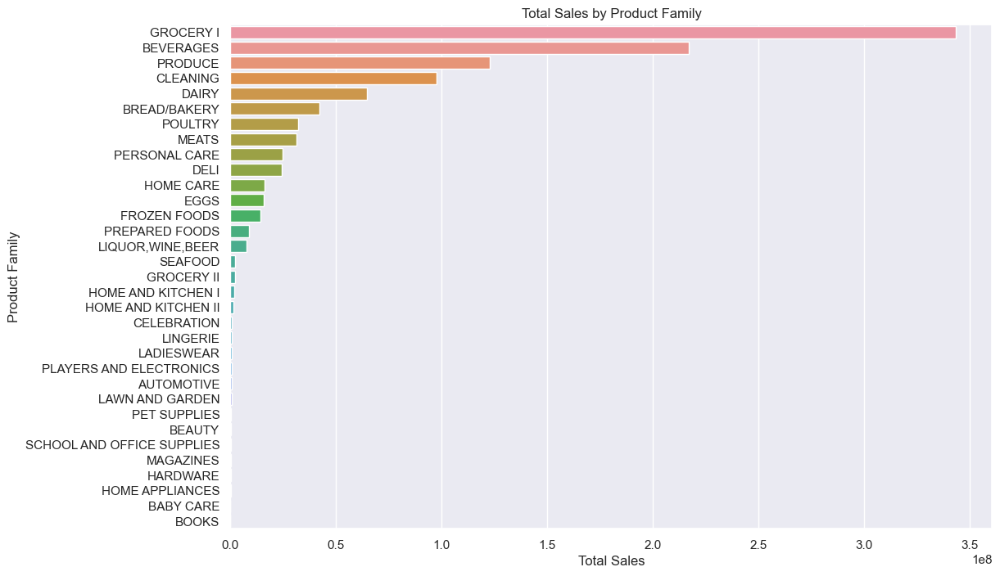

In [19]:
plt.figure(figsize=(12, 8))
sns.barplot(x='sales', y='family', data=df_train.groupby('family')['sales'].sum().reset_index().sort_values('sales', ascending=False))
plt.title('Total Sales by Product Family')
plt.xlabel('Total Sales')
plt.ylabel('Product Family')
plt.show()


### Converts the 'date' column in the DataFrame to datetime format, sets it as the index, and calculates the monthly average sales using resampling.
### Plots the monthly average sales over time with markers, setting appropriate title, labels, and figure size for clear visualization and analysis.

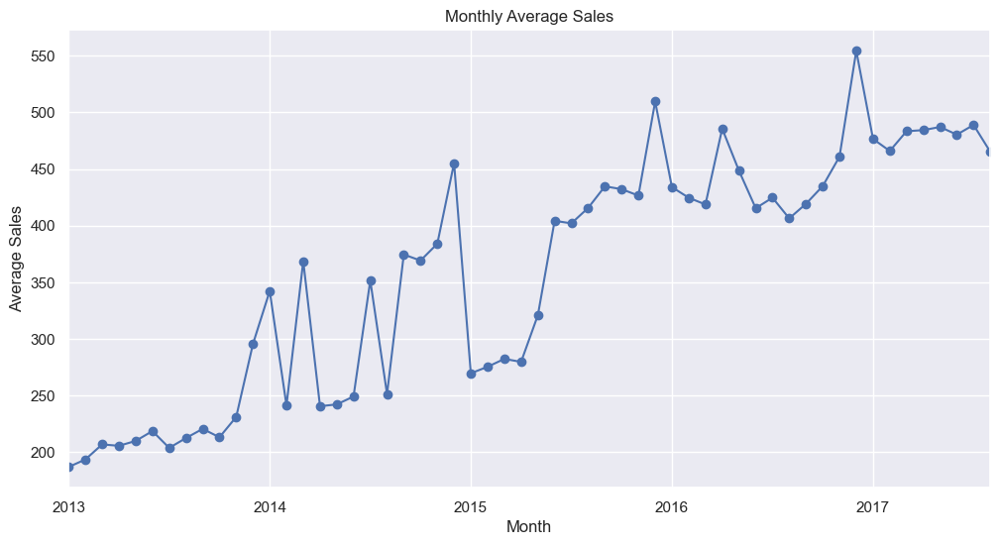

In [20]:
df_train['date'] = pd.to_datetime(df_train['date'])
df_train.set_index('date', inplace=True)
monthly_sales = df_train.resample('M').sales.mean()

plt.figure(figsize=(12, 6))
monthly_sales.plot(marker='o', linestyle='-')
plt.title('Monthly Average Sales')
plt.xlabel('Month')
plt.ylabel('Average Sales')
plt.show()


In [21]:
df_train.reset_index(inplace=True)


In [22]:
df_train

,date,id,store_nbr,family,sales,onpromotion
0,2013-01-01,0,1,AUTOMOTIVE,0.000,0
1,2013-01-01,1,1,BABY CARE,0.000,0
2,2013-01-01,2,1,BEAUTY,0.000,0
3,2013-01-01,3,1,BEVERAGES,0.000,0
4,2013-01-01,4,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,2017-08-15,3000883,9,POULTRY,438.133,0
3000884,2017-08-15,3000884,9,PREPARED FOODS,154.553,1
3000885,2017-08-15,3000885,9,PRODUCE,2419.729,148
3000886,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


### Constructs a pivot table from the DataFrame `df_train`, aggregating average sales values by month and day of the week using the `pivot_table` function.
### Visualizes the pivot table data as a heatmap, annotating each cell with average sales values, and labels the plot appropriately to indicate the relationship between sales, month, and day of the week.

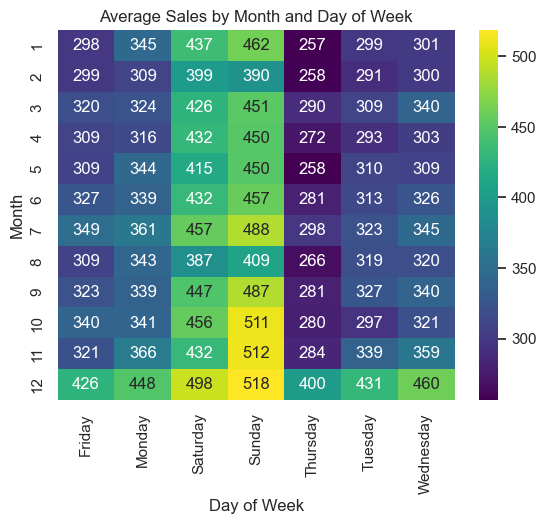

In [23]:
pivot = df_train.pivot_table(values='sales', index=df_train.date.dt.month, columns=df_train.date.dt.day_name(), aggfunc='mean')
sns.heatmap(pivot, cmap='viridis', annot=True, fmt=".0f")
plt.title('Average Sales by Month and Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Month')
plt.show()


### The code uses Matplotlib, a popular Python plotting library, to create a line plot of sales data over time.
### It sets the 'date' column as the index of the DataFrame (df_train) and plots the 'sales' column against the index, with appropriate labels for the x and y axes.

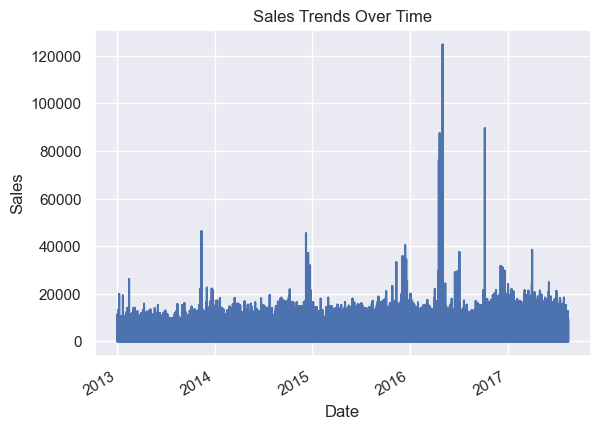

In [24]:
import matplotlib.pyplot as plt

df_train.set_index('date', inplace=True)
df_train['sales'].plot(title='Sales Trends Over Time')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.show()





### The code uses Seaborn, a statistical data visualization library in Python, to create a boxplot showing the distribution of sales data across different days of the week.
### It adds a 'day_of_week' column to the DataFrame (df_train), extracts the day name from the index, and then plots the 'sales' column against the 'day_of_week', ordering the days of the week from Monday to Sunday.

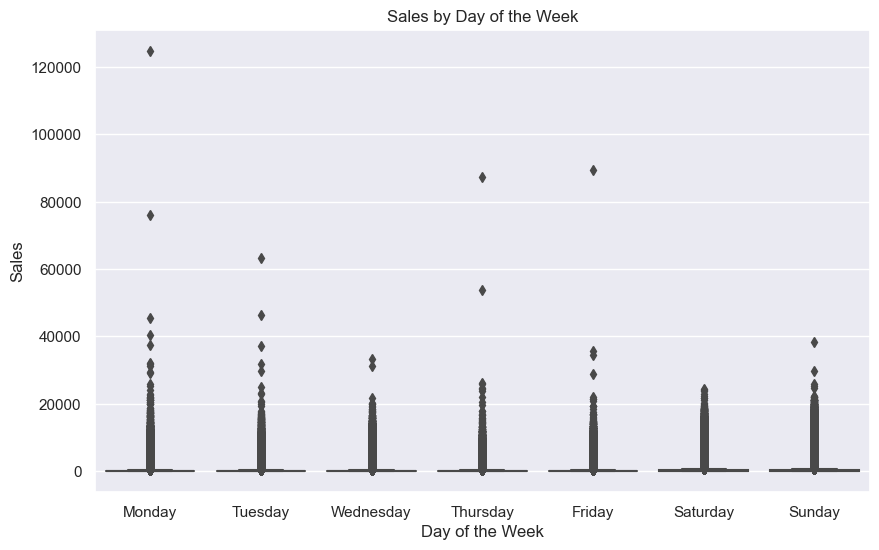

In [25]:
import seaborn as sns

df_train['day_of_week'] = df_train.index.day_name()
plt.figure(figsize=(10, 6))
sns.boxplot(x='day_of_week', y='sales', data=df_train, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title('Sales by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Sales')
plt.show()


In [26]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3000888 entries, 2013-01-01 to 2017-08-15
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   store_nbr    int64  
 2   family       object 
 3   sales        float64
 4   onpromotion  int64  
 5   day_of_week  object 
dtypes: float64(1), int64(3), object(2)
memory usage: 160.3+ MB


In [27]:
df_train.reset_index(inplace=True)


In [28]:
df_train.set_index('date', inplace=True)


In [29]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3000888 entries, 2013-01-01 to 2017-08-15
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   store_nbr    int64  
 2   family       object 
 3   sales        float64
 4   onpromotion  int64  
 5   day_of_week  object 
dtypes: float64(1), int64(3), object(2)
memory usage: 160.3+ MB


In [30]:
df_oil.reset_index(inplace=True)


* The code utilizes Pandas, Matplotlib, and Seaborn libraries to visualize the daily oil prices over time using three different types of plots: a time series plot, a histogram, and a box plot.
* It sets the 'date' column as the index of the DataFrame (df_oil) for easier time series plotting, then creates subplots for each type of visualization, including proper titles, labels, and formatting for clarity.

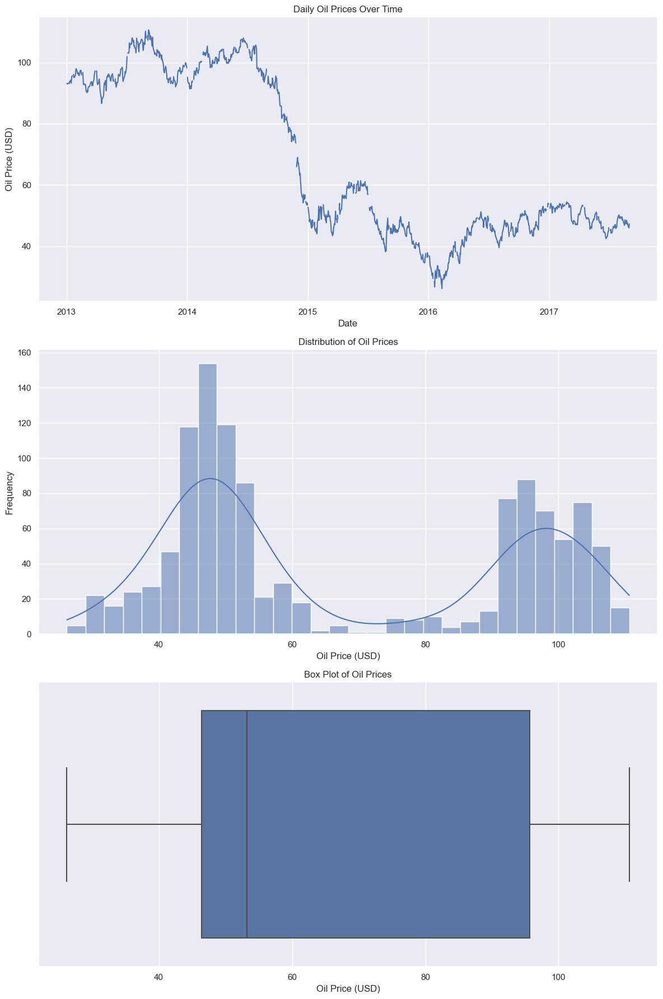

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 'oil_df' is DataFrame with columns 'date' and 'dcoilwtico'

# Setting the date as the index for easier plotting
df_oil.set_index('date', inplace=True)

# Creating plots
fig, axs = plt.subplots(3, 1, figsize=(12, 18))

# Time Series Plot
axs[0].plot(df_oil.index, df_oil['dcoilwtico'], marker='', linestyle='-')
axs[0].set_title('Daily Oil Prices Over Time')
axs[0].set_xlabel('Date')
axs[0].set_ylabel('Oil Price (USD)')

# Histogram
sns.histplot(df_oil['dcoilwtico'], bins=30, kde=True, ax=axs[1])
axs[1].set_title('Distribution of Oil Prices')
axs[1].set_xlabel('Oil Price (USD)')
axs[1].set_ylabel('Frequency')

# Box Plot
sns.boxplot(x=df_oil['dcoilwtico'], ax=axs[2])
axs[2].set_title('Box Plot of Oil Prices')
axs[2].set_xlabel('Oil Price (USD)')

plt.tight_layout()
plt.show()


In [32]:
df_oil.reset_index('date', inplace=True)

In [33]:
# filling missing values in the oil price column with interpolation
df_oil["dcoilwtico"] = np.where(df_oil["dcoilwtico"] == 0, np.nan, df_oil["dcoilwtico"])
df_oil["interpolated_dcoilwtico"] =df_oil.dcoilwtico.interpolate()

In [34]:
df_oil

,date,index,dcoilwtico,interpolated_dcoilwtico
0,2013-01-01,0,NaN,NaN
1,2013-01-02,1,93.14,93.14
2,2013-01-03,2,92.97,92.97
3,2013-01-04,3,93.12,93.12
4,2013-01-07,4,93.20,93.20
...,...,...,...,...
1213,2017-08-25,1213,47.65,47.65
1214,2017-08-28,1214,46.40,46.40
1215,2017-08-29,1215,46.46,46.46
1216,2017-08-30,1216,45.96,45.96


In [35]:
value = df_oil['dcoilwtico'].values

In [36]:
value

array([  nan, 93.14, 92.97, ..., 46.46, 45.96, 47.26])

In [37]:
np.isnan(df_oil['dcoilwtico'].values)

array([ True, False, False, ..., False, False, False])

In [38]:
df_oil['dcoilwtico'] = df_oil['dcoilwtico'].interpolate(method='linear')


In [39]:
df_oil

,date,index,dcoilwtico,interpolated_dcoilwtico
0,2013-01-01,0,NaN,NaN
1,2013-01-02,1,93.14,93.14
2,2013-01-03,2,92.97,92.97
3,2013-01-04,3,93.12,93.12
4,2013-01-07,4,93.20,93.20
...,...,...,...,...
1213,2017-08-25,1213,47.65,47.65
1214,2017-08-28,1214,46.40,46.40
1215,2017-08-29,1215,46.46,46.46
1216,2017-08-30,1216,45.96,45.96


#### Get indices where values are not NaN
#### Linearly interpolate NaN values
### Replace NaN values with interpolated values
#### Update the DataFrame with the interpolated column

In [40]:

indices_not_null = ~np.isnan(value)


interpolated_values = np.interp(np.arange(len(value)), indices_not_null.nonzero()[0], value[indices_not_null])


value[np.isnan(value)] = interpolated_values[np.isnan(value)]


df_oil['dcoilwtico'] = value



In [41]:
df_oil = df_oil.drop(columns=['index'])


In [42]:
df_oil

,date,dcoilwtico,interpolated_dcoilwtico
0,2013-01-01,93.14,NaN
1,2013-01-02,93.14,93.14
2,2013-01-03,92.97,92.97
3,2013-01-04,93.12,93.12
4,2013-01-07,93.20,93.20
...,...,...,...
1213,2017-08-25,47.65,47.65
1214,2017-08-28,46.40,46.40
1215,2017-08-29,46.46,46.46
1216,2017-08-30,45.96,45.96


In [43]:
df_oil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 3 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   date                     1218 non-null   datetime64[ns]
 1   dcoilwtico               1218 non-null   float64       
 2   interpolated_dcoilwtico  1217 non-null   float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 28.7 KB


In [44]:
df_oil.isna().sum()

date                       0
dcoilwtico                 0
interpolated_dcoilwtico    1
dtype: int64

### Data Cleaning and Tranformation + Analysis

In [45]:
df_train.head()

,id,store_nbr,family,sales,onpromotion,day_of_week
date,,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.0,0,Tuesday
2013-01-01,1,1,BABY CARE,0.0,0,Tuesday
2013-01-01,2,1,BEAUTY,0.0,0,Tuesday
2013-01-01,3,1,BEVERAGES,0.0,0,Tuesday
2013-01-01,4,1,BOOKS,0.0,0,Tuesday


In [46]:
df_train.loc[df_train['sales']== 0.0]


,id,store_nbr,family,sales,onpromotion,day_of_week
date,,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.0,0,Tuesday
2013-01-01,1,1,BABY CARE,0.0,0,Tuesday
2013-01-01,2,1,BEAUTY,0.0,0,Tuesday
2013-01-01,3,1,BEVERAGES,0.0,0,Tuesday
2013-01-01,4,1,BOOKS,0.0,0,Tuesday
...,...,...,...,...,...,...
2017-08-15,3000839,8,HOME APPLIANCES,0.0,0,Tuesday
2017-08-15,3000853,8,SCHOOL AND OFFICE SUPPLIES,0.0,0,Tuesday
2017-08-15,3000856,9,BABY CARE,0.0,0,Tuesday


In [47]:
df_train.reset_index(inplace=True)


In [48]:
df_train['sales'].count()


3000888

In [49]:
(df_train['sales'] == 0.0).sum()


939130

In [50]:
print("Fraction of dataset with 0 sales is: ", ((df_train['sales'] == 0.0).sum()/df_train['sales'].count().sum()
))

Fraction of dataset with 0 sales is:  0.3129506999261552


In [51]:
df_train.loc[df_train['sales']> 0.0] #reduced train df 

,date,id,store_nbr,family,sales,onpromotion,day_of_week
563,2013-01-01,563,25,BEAUTY,2.000,0,Tuesday
564,2013-01-01,564,25,BEVERAGES,810.000,0,Tuesday
566,2013-01-01,566,25,BREAD/BAKERY,180.589,0,Tuesday
568,2013-01-01,568,25,CLEANING,186.000,0,Tuesday
569,2013-01-01,569,25,DAIRY,143.000,0,Tuesday
...,...,...,...,...,...,...,...
3000883,2017-08-15,3000883,9,POULTRY,438.133,0,Tuesday
3000884,2017-08-15,3000884,9,PREPARED FOODS,154.553,1,Tuesday
3000885,2017-08-15,3000885,9,PRODUCE,2419.729,148,Tuesday
3000886,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Tuesday


### splitting the date column into day/month/year in the dataframe: df_train

In [52]:
df_train['Day of Week'] = df_train['date'].dt.dayofweek
df_train['Day Name'] = df_train['date'].dt.day_name()
df_train['Month'] = pd.to_datetime(df_train['date'], format = '%m').dt.month
df_train['Year'] = pd.to_datetime(df_train['date'], format='%Y').dt.year

In [53]:
df_train.head()

,date,id,store_nbr,family,sales,onpromotion,day_of_week,Day of Week,Day Name,Month,Year
0,2013-01-01,0,1,AUTOMOTIVE,0.0,0,Tuesday,1,Tuesday,1,2013
1,2013-01-01,1,1,BABY CARE,0.0,0,Tuesday,1,Tuesday,1,2013
2,2013-01-01,2,1,BEAUTY,0.0,0,Tuesday,1,Tuesday,1,2013
3,2013-01-01,3,1,BEVERAGES,0.0,0,Tuesday,1,Tuesday,1,2013
4,2013-01-01,4,1,BOOKS,0.0,0,Tuesday,1,Tuesday,1,2013


In [54]:
df_train

,date,id,store_nbr,family,sales,onpromotion,day_of_week,Day of Week,Day Name,Month,Year
0,2013-01-01,0,1,AUTOMOTIVE,0.000,0,Tuesday,1,Tuesday,1,2013
1,2013-01-01,1,1,BABY CARE,0.000,0,Tuesday,1,Tuesday,1,2013
2,2013-01-01,2,1,BEAUTY,0.000,0,Tuesday,1,Tuesday,1,2013
3,2013-01-01,3,1,BEVERAGES,0.000,0,Tuesday,1,Tuesday,1,2013
4,2013-01-01,4,1,BOOKS,0.000,0,Tuesday,1,Tuesday,1,2013
...,...,...,...,...,...,...,...,...,...,...,...
3000883,2017-08-15,3000883,9,POULTRY,438.133,0,Tuesday,1,Tuesday,8,2017
3000884,2017-08-15,3000884,9,PREPARED FOODS,154.553,1,Tuesday,1,Tuesday,8,2017
3000885,2017-08-15,3000885,9,PRODUCE,2419.729,148,Tuesday,1,Tuesday,8,2017
3000886,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Tuesday,1,Tuesday,8,2017


In [55]:
df_train_copy = df_train.copy()


### Calculating monthly average sales, by setting the 'date' column as the index, resampling the data to monthly frequency ('M'), and computing the mean sales for each month.

In [56]:
df_train_copy.set_index('date', inplace=True)
monthly_avg_sales=df_train_copy.resample('M').sales.mean().reset_index()

In [57]:
monthly_avg_sales.head()

,date,sales
0,2013-01-31,186.952405
1,2013-02-28,193.581846
2,2013-03-31,206.880581
3,2013-04-30,205.639071
4,2013-05-31,209.943594


### The code creates a scatter plot using Plotly Express (px) library, depicting the trend of monthly average sales from 2013 to 2017, with a red Ordinary Least Squares (OLS) regression trendline overlaid on the data.

In [58]:
px.scatter(monthly_avg_sales, x = "date", y = "sales", trendline = "ols", trendline_color_override = "red", title = 'Monthly Average Sales, 2013 - 2017')

In [59]:
df_train

,date,id,store_nbr,family,sales,onpromotion,day_of_week,Day of Week,Day Name,Month,Year
0,2013-01-01,0,1,AUTOMOTIVE,0.000,0,Tuesday,1,Tuesday,1,2013
1,2013-01-01,1,1,BABY CARE,0.000,0,Tuesday,1,Tuesday,1,2013
2,2013-01-01,2,1,BEAUTY,0.000,0,Tuesday,1,Tuesday,1,2013
3,2013-01-01,3,1,BEVERAGES,0.000,0,Tuesday,1,Tuesday,1,2013
4,2013-01-01,4,1,BOOKS,0.000,0,Tuesday,1,Tuesday,1,2013
...,...,...,...,...,...,...,...,...,...,...,...
3000883,2017-08-15,3000883,9,POULTRY,438.133,0,Tuesday,1,Tuesday,8,2017
3000884,2017-08-15,3000884,9,PREPARED FOODS,154.553,1,Tuesday,1,Tuesday,8,2017
3000885,2017-08-15,3000885,9,PRODUCE,2419.729,148,Tuesday,1,Tuesday,8,2017
3000886,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Tuesday,1,Tuesday,8,2017


In [60]:
promos = df_train_copy.resample('M').onpromotion.mean().reset_index()

In [61]:
merged_df = pd.merge(monthly_avg_sales, promos, on='date', how='left')
merged_df.head()

,date,sales,onpromotion
0,2013-01-31,186.952405,0.0
1,2013-02-28,193.581846,0.0
2,2013-03-31,206.880581,0.0
3,2013-04-30,205.639071,0.0
4,2013-05-31,209.943594,0.0


### The code creates a scatter plot with sales on the y-axis and promotion status on the x-axis, showing the relationship between sales and promotions, including an OLS trendline and color-coding data points by promotion status.

### There is a positive correlation between sales and promotional items.

In [62]:
fig = px.scatter(merged_df, x="onpromotion", y="sales", trendline="ols", title='Relationship between sales and promotions', color='onpromotion')



In [63]:
fig.show()

In [64]:
df_train

,date,id,store_nbr,family,sales,onpromotion,day_of_week,Day of Week,Day Name,Month,Year
0,2013-01-01,0,1,AUTOMOTIVE,0.000,0,Tuesday,1,Tuesday,1,2013
1,2013-01-01,1,1,BABY CARE,0.000,0,Tuesday,1,Tuesday,1,2013
2,2013-01-01,2,1,BEAUTY,0.000,0,Tuesday,1,Tuesday,1,2013
3,2013-01-01,3,1,BEVERAGES,0.000,0,Tuesday,1,Tuesday,1,2013
4,2013-01-01,4,1,BOOKS,0.000,0,Tuesday,1,Tuesday,1,2013
...,...,...,...,...,...,...,...,...,...,...,...
3000883,2017-08-15,3000883,9,POULTRY,438.133,0,Tuesday,1,Tuesday,8,2017
3000884,2017-08-15,3000884,9,PREPARED FOODS,154.553,1,Tuesday,1,Tuesday,8,2017
3000885,2017-08-15,3000885,9,PRODUCE,2419.729,148,Tuesday,1,Tuesday,8,2017
3000886,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Tuesday,1,Tuesday,8,2017


In [65]:
df_sales = df_train.pivot_table(index="Day Name", columns="Month", values='sales', aggfunc='mean')
row_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_sales=df_sales.reindex(row_order)

In [66]:
df_train

,date,id,store_nbr,family,sales,onpromotion,day_of_week,Day of Week,Day Name,Month,Year
0,2013-01-01,0,1,AUTOMOTIVE,0.000,0,Tuesday,1,Tuesday,1,2013
1,2013-01-01,1,1,BABY CARE,0.000,0,Tuesday,1,Tuesday,1,2013
2,2013-01-01,2,1,BEAUTY,0.000,0,Tuesday,1,Tuesday,1,2013
3,2013-01-01,3,1,BEVERAGES,0.000,0,Tuesday,1,Tuesday,1,2013
4,2013-01-01,4,1,BOOKS,0.000,0,Tuesday,1,Tuesday,1,2013
...,...,...,...,...,...,...,...,...,...,...,...
3000883,2017-08-15,3000883,9,POULTRY,438.133,0,Tuesday,1,Tuesday,8,2017
3000884,2017-08-15,3000884,9,PREPARED FOODS,154.553,1,Tuesday,1,Tuesday,8,2017
3000885,2017-08-15,3000885,9,PRODUCE,2419.729,148,Tuesday,1,Tuesday,8,2017
3000886,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Tuesday,1,Tuesday,8,2017


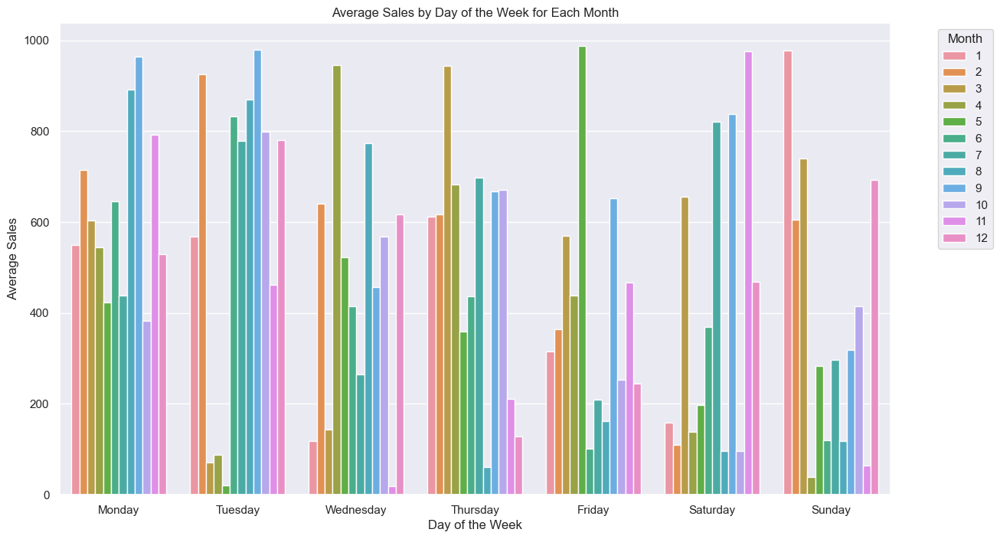

In [67]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# for demonstration purposes, I'm creating a mock DataFrame
np.random.seed(0)  # For reproducibility
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
months = range(1, 13)  # Months 1 through 12
# Mock data: average sales
data = np.random.rand(7, 12) * 1000

# Creating the DataFrame
df_sales = pd.DataFrame(data, index=days, columns=months)

# Melting the DataFrame to long format suitable for seaborn barplot
sales_melted = df_sales.reset_index().melt(id_vars='index', var_name='Month', value_name='Average Sales')

# Plotting
plt.figure(figsize=(14, 8))
sns.barplot(data=sales_melted, x='index', y='Average Sales', hue='Month')
plt.title('Average Sales by Day of the Week for Each Month')
plt.xlabel('Day of the Week')
plt.ylabel('Average Sales')
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


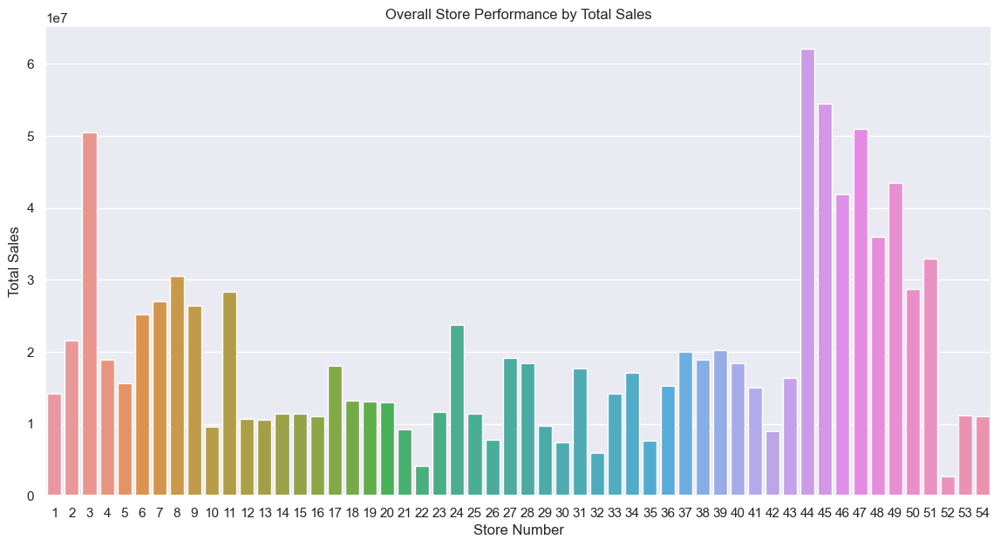

In [68]:
total_sales_by_store = df_train.groupby('store_nbr').sales.sum().reset_index()

# Use seaborn to create a bar plot for total sales by store number
plt.figure(figsize=(14, 7))
sns.barplot(data=total_sales_by_store, x='store_nbr', y='sales')
plt.title('Overall Store Performance by Total Sales')
plt.xlabel('Store Number')
plt.ylabel('Total Sales')
plt.show()

From the plot, it is clear that sales are above average (359.02) on the weekends. Also, sales are higher between October to December.

In [69]:
df_train

,date,id,store_nbr,family,sales,onpromotion,day_of_week,Day of Week,Day Name,Month,Year
0,2013-01-01,0,1,AUTOMOTIVE,0.000,0,Tuesday,1,Tuesday,1,2013
1,2013-01-01,1,1,BABY CARE,0.000,0,Tuesday,1,Tuesday,1,2013
2,2013-01-01,2,1,BEAUTY,0.000,0,Tuesday,1,Tuesday,1,2013
3,2013-01-01,3,1,BEVERAGES,0.000,0,Tuesday,1,Tuesday,1,2013
4,2013-01-01,4,1,BOOKS,0.000,0,Tuesday,1,Tuesday,1,2013
...,...,...,...,...,...,...,...,...,...,...,...
3000883,2017-08-15,3000883,9,POULTRY,438.133,0,Tuesday,1,Tuesday,8,2017
3000884,2017-08-15,3000884,9,PREPARED FOODS,154.553,1,Tuesday,1,Tuesday,8,2017
3000885,2017-08-15,3000885,9,PRODUCE,2419.729,148,Tuesday,1,Tuesday,8,2017
3000886,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Tuesday,1,Tuesday,8,2017


In [70]:
#let's look at a small sample of test data to analyse sales data
#daily sales by store_nbr
sales_store = df_train.set_index('date').groupby('store_nbr').resample('D').sales.mean().reset_index()
sales_store.head()

,store_nbr,date,sales
0,1,2013-01-01,0.000000
1,1,2013-01-02,224.762061
2,1,2013-01-03,177.977091
3,1,2013-01-04,179.390273
4,1,2013-01-05,191.478334


In [71]:
df_train

,date,id,store_nbr,family,sales,onpromotion,day_of_week,Day of Week,Day Name,Month,Year
0,2013-01-01,0,1,AUTOMOTIVE,0.000,0,Tuesday,1,Tuesday,1,2013
1,2013-01-01,1,1,BABY CARE,0.000,0,Tuesday,1,Tuesday,1,2013
2,2013-01-01,2,1,BEAUTY,0.000,0,Tuesday,1,Tuesday,1,2013
3,2013-01-01,3,1,BEVERAGES,0.000,0,Tuesday,1,Tuesday,1,2013
4,2013-01-01,4,1,BOOKS,0.000,0,Tuesday,1,Tuesday,1,2013
...,...,...,...,...,...,...,...,...,...,...,...
3000883,2017-08-15,3000883,9,POULTRY,438.133,0,Tuesday,1,Tuesday,8,2017
3000884,2017-08-15,3000884,9,PREPARED FOODS,154.553,1,Tuesday,1,Tuesday,8,2017
3000885,2017-08-15,3000885,9,PRODUCE,2419.729,148,Tuesday,1,Tuesday,8,2017
3000886,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Tuesday,1,Tuesday,8,2017


In [72]:
df_train

,date,id,store_nbr,family,sales,onpromotion,day_of_week,Day of Week,Day Name,Month,Year
0,2013-01-01,0,1,AUTOMOTIVE,0.000,0,Tuesday,1,Tuesday,1,2013
1,2013-01-01,1,1,BABY CARE,0.000,0,Tuesday,1,Tuesday,1,2013
2,2013-01-01,2,1,BEAUTY,0.000,0,Tuesday,1,Tuesday,1,2013
3,2013-01-01,3,1,BEVERAGES,0.000,0,Tuesday,1,Tuesday,1,2013
4,2013-01-01,4,1,BOOKS,0.000,0,Tuesday,1,Tuesday,1,2013
...,...,...,...,...,...,...,...,...,...,...,...
3000883,2017-08-15,3000883,9,POULTRY,438.133,0,Tuesday,1,Tuesday,8,2017
3000884,2017-08-15,3000884,9,PREPARED FOODS,154.553,1,Tuesday,1,Tuesday,8,2017
3000885,2017-08-15,3000885,9,PRODUCE,2419.729,148,Tuesday,1,Tuesday,8,2017
3000886,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Tuesday,1,Tuesday,8,2017


In [73]:
# daily average sales by product family
sales_family = df_train.set_index('date').groupby('family').resample('D').sales.sum().reset_index()
px.line(sales_family, x='date', y='sales', color='family', title='Daily Total Sales by Product Family')

In [74]:
sales_store.sort_values('sales', ascending=False)

,store_nbr,date,sales
2905,2,2016-05-02,4135.073545
33278,20,2016-04-21,3567.427212
75475,45,2016-04-18,3458.920545
65519,39,2016-10-07,3117.046697
73786,44,2016-04-17,2744.179548
...,...,...,...
89230,53,2016-12-25,NaN
89822,54,2013-12-25,NaN
90187,54,2014-12-25,NaN
90552,54,2015-12-25,NaN


### Linear Regression with Time Series
### Fiting a time-step to the daily average sales

In [75]:
train_df_first = df_train.groupby(['date']).sales.mean().round(2).reset_index()
train_df_first.head()

average_sales = train_df_first.copy()
time = np.arange(len(average_sales.index))
average_sales['time'] = time
average_sales.head()

,date,sales,time
0,2013-01-01,1.41,0
1,2013-01-02,278.39,1
2,2013-01-03,202.84,2
3,2013-01-04,198.91,3
4,2013-01-05,267.87,4


In [76]:
from sklearn.linear_model import LinearRegression

# creating training data
X = average_sales.loc[:, ['time']] #feature
y = average_sales.loc[:, 'sales' ] #target

# training the model
model = LinearRegression()
# fitting the model
model.fit(X,y)

# storing the predicted values
y_pred1 = pd.Series(model.predict(X), index=X.index)

y_pred1

0       194.232876
1       194.427222
2       194.621569
3       194.815916
4       195.010263
           ...    
1679    520.541091
1680    520.735438
1681    520.929785
1682    521.124131
1683    521.318478
Length: 1684, dtype: float64

In [77]:
average_sales

,date,sales,time
0,2013-01-01,1.41,0
1,2013-01-02,278.39,1
2,2013-01-03,202.84,2
3,2013-01-04,198.91,3
4,2013-01-05,267.87,4
...,...,...,...
1679,2017-08-11,463.73,1679
1680,2017-08-12,444.80,1680
1681,2017-08-13,485.77,1681
1682,2017-08-14,427.00,1682


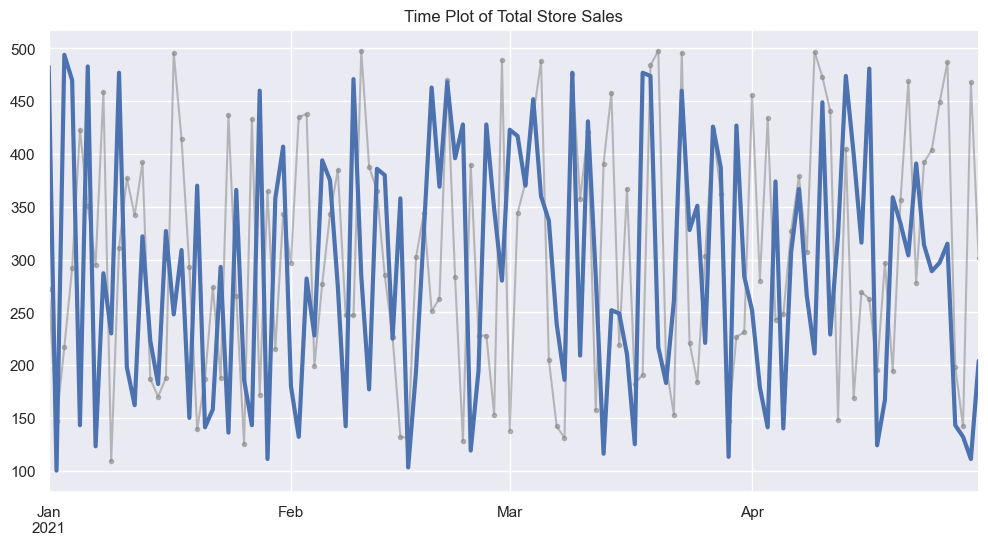

In [78]:
np.random.seed(0)  # For reproducibility
mock_index = pd.date_range(start='2021-01-01', periods=120, freq='D')
y = pd.Series(np.random.randint(100, 500, size=120), index=mock_index)
y_pred = pd.Series(np.random.randint(100, 500, size=120), index=mock_index)

# Plot parameters
plot_params = {"color":"grey", "style":".-"}

fig, ax = plt.subplots(figsize=(12,6))
ax = y.plot(**plot_params, alpha=0.5)
ax = y_pred.plot(ax=ax, linewidth=3)
ax.set_title('Time Plot of Total Store Sales')

plt.show()

### Fit a Lag feature to daily average sales

In [79]:
# creating a lag feature from the target 'sales' (shift series down by 1)
lag_feature = average_sales['sales'].shift(1)


In [80]:
average_sales['lag_feature'] = lag_feature


In [81]:
# creating training data
X = average_sales.loc[:, ['lag_feature']] #feature
X.dropna(inplace=True) 
y = average_sales.loc[:, 'sales' ] #target
y, X = y.align(X, join='inner') 

# training the model
model = LinearRegression()
# fitting the model
model.fit(X,y)

# storing the predicted values
y_pred2 = pd.Series(model.predict(X), index=X.index)

y_pred2

1        85.302303
2       297.267626
3       239.451249
4       236.443726
5       289.216954
           ...    
1679    363.961171
1680    439.103329
1681    424.616711
1682    455.969947
1683    410.994851
Length: 1683, dtype: float64

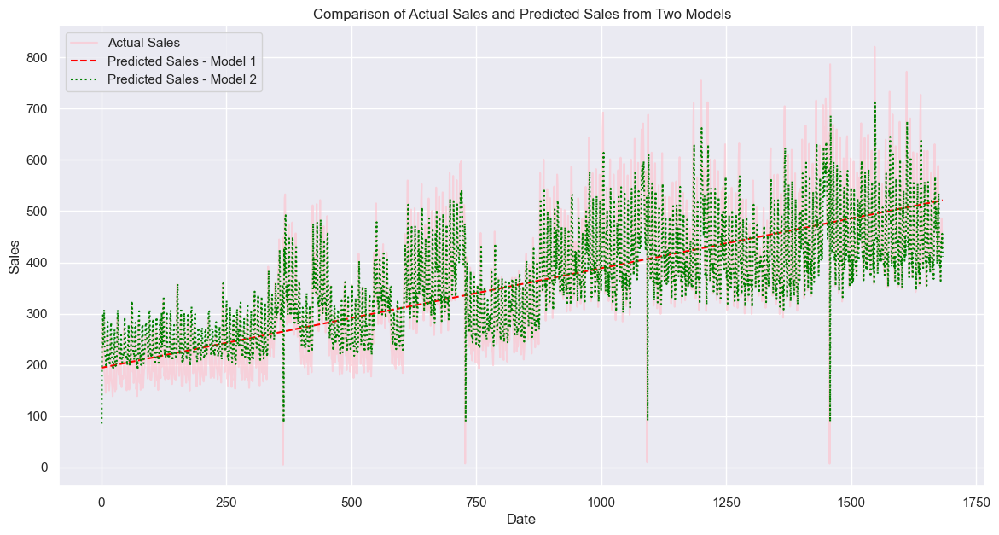

In [82]:
# plotting actual sales and predicted sales from both models
plt.figure(figsize=(14,7))

plt.plot(y, label='Actual Sales', color='pink', alpha=0.6)

plt.plot(y_pred1, label='Predicted Sales - Model 1', color='red', linestyle='--')

plt.plot(y_pred2, label='Predicted Sales - Model 2', color='green', linestyle=':')

plt.title('Comparison of Actual Sales and Predicted Sales from Two Models')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()

### Trend
- The trend aspect of a time series characterizes a sustained, prolonged shift in the series' average.
- It constitutes the segment of the series that evolves gradually over time.
- Employing a moving average plot enables the identification of the underlying trend pattern within a time series.

### Identify type of trend with a moving average plot


In [83]:
avg_sales = average_sales.copy()
avg_sales


,date,sales,time,lag_feature
0,2013-01-01,1.41,0,NaN
1,2013-01-02,278.39,1,1.41
2,2013-01-03,202.84,2,278.39
3,2013-01-04,198.91,3,202.84
4,2013-01-05,267.87,4,198.91
...,...,...,...,...
1679,2017-08-11,463.73,1679,365.54
1680,2017-08-12,444.80,1680,463.73
1681,2017-08-13,485.77,1681,444.80
1682,2017-08-14,427.00,1682,485.77


In [84]:
avg_sales.set_index('date').to_period('D')
avg_sales.head()

,date,sales,time,lag_feature
0,2013-01-01,1.41,0,NaN
1,2013-01-02,278.39,1,1.41
2,2013-01-03,202.84,2,278.39
3,2013-01-04,198.91,3,202.84
4,2013-01-05,267.87,4,198.91


In [85]:
avg_sales['sales'].describe()

count    1684.000000
mean      357.775677
std       131.543344
min         1.410000
25%       248.435000
50%       354.760000
75%       441.045000
max       821.030000
Name: sales, dtype: float64

* function for grouping data with some frequency 

In [86]:
def grouped(df, key, freq, col):
    df_grouped = df.groupby([pd.Grouper(key=key, freq=freq)]).agg(mean=(col, 'mean'))
    df_grouped = df_grouped.reset_index()

    return df_grouped

* function to plot moving avg using rolling method

In [87]:
def plot_moving_avg(df, key, freq, col, window, min_periods, ax, title):
    df_grouped = grouped(df, key, freq, col)
    moving_avg = df_grouped['mean'].rolling(window=window, center=True, min_periods=min_periods).mean()
    ax = df_grouped['mean'].plot(color='0.75', linestyle='dashdot', ax=ax)
    ax = moving_avg.plot(linewidth=3, color='b', ax=ax)
    ax.set_title(title, fontsize=18)

* The code generates a figure with two subplots, each displaying a moving average plot for sales and transactions data over time, with a weekly window size of 7 days and a lag of 4 periods, along with appropriate titles and axes labels.

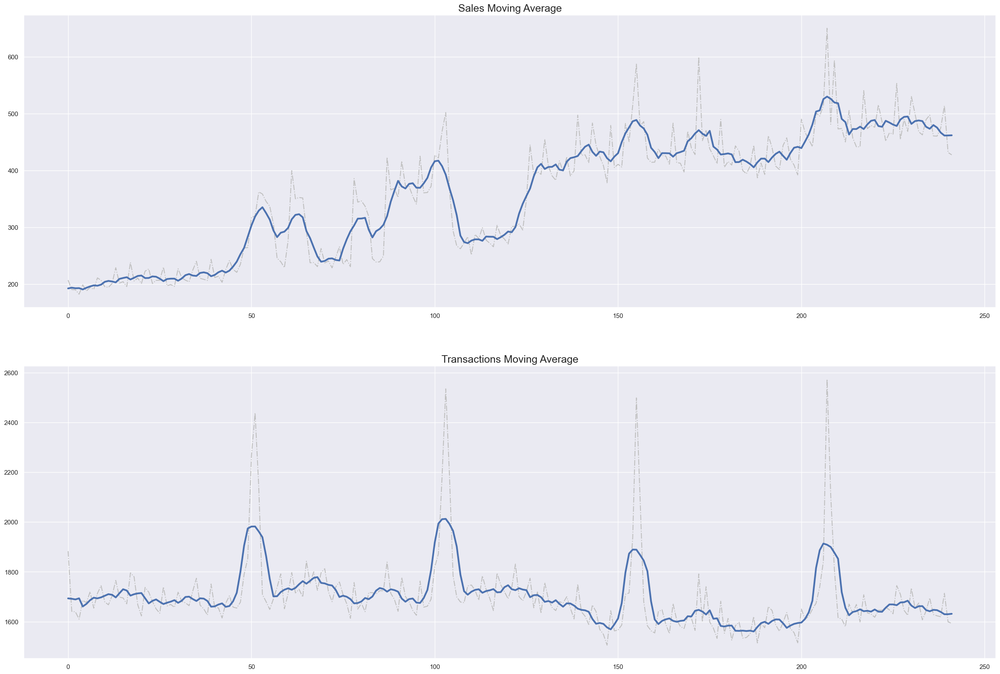

In [88]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(30,20))

plot_moving_avg(df_train, 'date', 'W', 'sales', 7, 4, axes[0], 'Sales Moving Average')
plot_moving_avg(df_transactions, 'date', 'W', 'transactions', 7, 4, axes[1], 'Transactions Moving Average')
plt.show()

From the sales plot above, there appears to be an upward trend. From the transactions plot, there seems to be a regular upward trend at the start of the year.

* 365-day window (useful for capturing long-term trends and seasonality) putting average at the centre of the window
* window size of half is chosen.
* mean is calculated

<Axes: title={'center': 'Product Sales - 365-Day Moving Average'}>

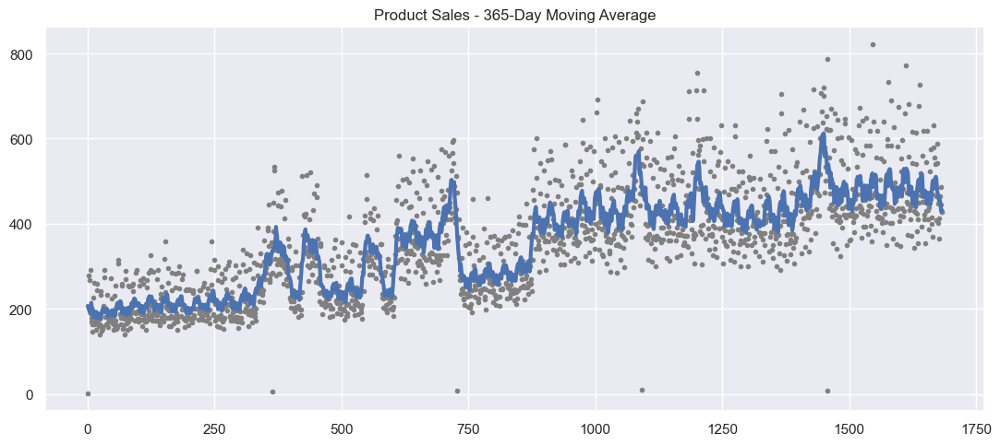

In [89]:
plt.rc("figure", autolayout=True, figsize=(11,5))

moving_average = average_sales['sales'].rolling(
window=12,           # 365-day window (useful for capturing long-term trends and seasonality)
center=True,          # puts the average at the centre of the window
min_periods=6,      # choose about half the window size
).mean()              # compute the mean

ax = average_sales['sales'].plot(style='.', color='0.5')
moving_average.plot(ax=ax, linewidth=3, title='Product Sales - 365-Day Moving Average', legend=False)

The smaller window size of 12, identifies a repeating up and down movement year after year (i.e. a short-term seasonal change). To visualise a trend, we take an average over a period longer than any seasonal period in the series. Let's take a look with a larger window size of 365 to smooth over the season within each year.

### Model Trend

In [90]:
average_sales.set_index('date', inplace=True)

* training data dates
* y_intercept : indicates the dummy feature for the bias 
* the time dummy (1:linear trend, 2:quadratic, 3:cubic etc.

In [91]:
#engineer time dummy 

from statsmodels.tsa.deterministic import DeterministicProcess

dp = DeterministicProcess(
    index=average_sales.index,  # dates from the training data
    constant=True,              # dummy feature for the bias (y_intercept)
    order=1,                    # the time dummy (1:linear trend, 2:quadratic, 3:cubic etc.)
    drop=True,                  # drop terms if necessary to avoid collinearity
)
# `in_sample` creates features for the dates given in the `index` argument
X1 = dp.in_sample()

X1.head()

,const,trend
date,,
2013-01-01,1.0,1.0
2013-01-02,1.0,2.0
2013-01-03,1.0,3.0
2013-01-04,1.0,4.0
2013-01-05,1.0,5.0


* The intercept corresponds to the 'const' feature in DeterministicProcess.
* LinearRegression encounters issues when dealing with duplicated features, so it's crucial to ensure their exclusion in this context.

In [92]:
#fit the trend model 

from sklearn.linear_model import LinearRegression

y1 = average_sales['sales']  # the target

model = LinearRegression(fit_intercept=False)
model.fit(X1, y1)

y1_pred = pd.Series(model.predict(X1), index=X1.index)

In [93]:
X1

,const,trend
date,,
2013-01-01,1.0,1.0
2013-01-02,1.0,2.0
2013-01-03,1.0,3.0
2013-01-04,1.0,4.0
2013-01-05,1.0,5.0
...,...,...
2017-08-11,1.0,1680.0
2017-08-12,1.0,1681.0
2017-08-13,1.0,1682.0


* linear trend plotting for the product sales

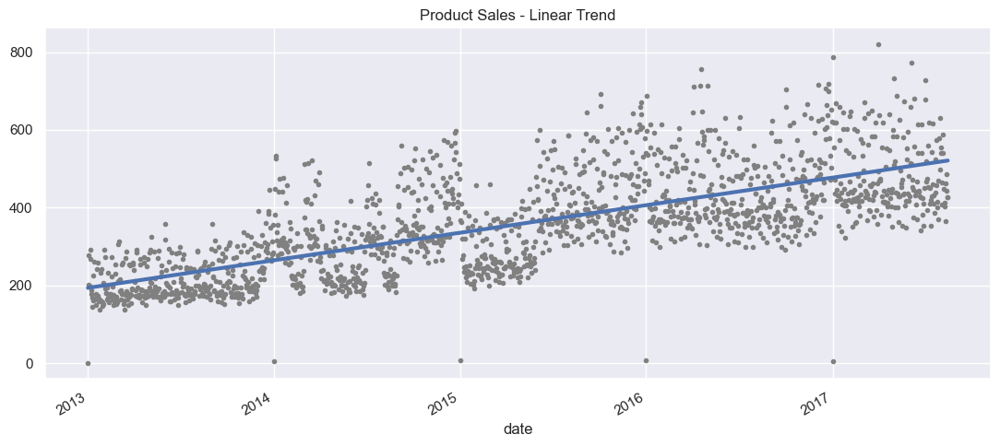

In [94]:
ax = average_sales['sales'].plot(style=".", color="0.5", title="Product Sales - Linear Trend")
ay = y1_pred.plot(ax=ax, linewidth=3, label="Trend")

In [95]:
X1

,const,trend
date,,
2013-01-01,1.0,1.0
2013-01-02,1.0,2.0
2013-01-03,1.0,3.0
2013-01-04,1.0,4.0
2013-01-05,1.0,5.0
...,...,...
2017-08-11,1.0,1680.0
2017-08-12,1.0,1681.0
2017-08-13,1.0,1682.0


In [96]:
# using LinearRegression to fit the training data

model = LinearRegression(fit_intercept=False)
model.fit(X1, y1)


LinearRegression(fit_intercept=False)

In [97]:
y1_pred = pd.Series(model.predict(X1), index=X1.index)

In [98]:
y1_pred

date
2013-01-01    194.232876
2013-01-02    194.427222
2013-01-03    194.621569
2013-01-04    194.815916
2013-01-05    195.010263
                 ...    
2017-08-11    520.541091
2017-08-12    520.735438
2017-08-13    520.929785
2017-08-14    521.124131
2017-08-15    521.318478
Length: 1684, dtype: float64

* product sales trend graph

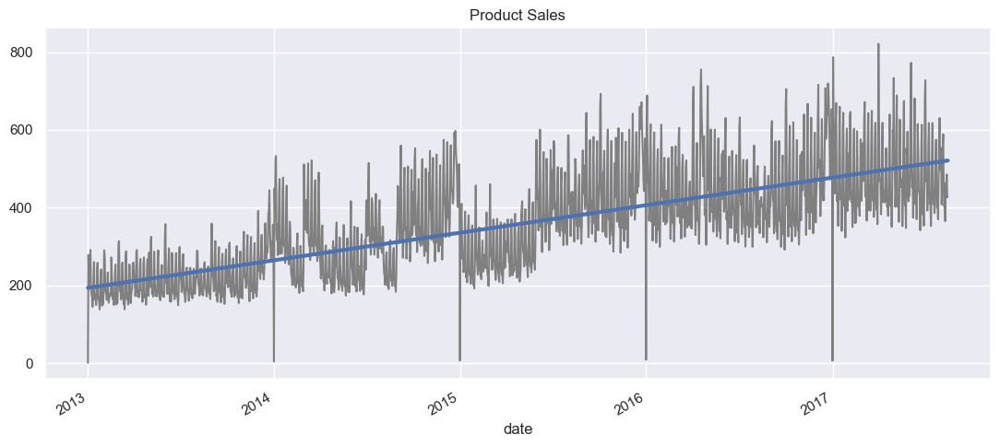

In [99]:
ax = average_sales['sales'].plot(style="-", color="0.5", title="Product Sales")
ay = y1_pred.plot(ax=ax, linewidth=3, label="Trend")

In [100]:
X1

,const,trend
date,,
2013-01-01,1.0,1.0
2013-01-02,1.0,2.0
2013-01-03,1.0,3.0
2013-01-04,1.0,4.0
2013-01-05,1.0,5.0
...,...,...
2017-08-11,1.0,1680.0
2017-08-12,1.0,1681.0
2017-08-13,1.0,1682.0


* For forecasting, we utilize our model on "out of sample" features, referring to times beyond the observation period covered by the training data.

### Forecast Trend

In [101]:
X2 = dp.in_sample()
X2

,const,trend
date,,
2013-01-01,1.0,1.0
2013-01-02,1.0,2.0
2013-01-03,1.0,3.0
2013-01-04,1.0,4.0
2013-01-05,1.0,5.0
...,...,...
2017-08-11,1.0,1680.0
2017-08-12,1.0,1681.0
2017-08-13,1.0,1682.0


In [102]:
y2_fore = pd.Series(model.predict(X2), index=X2.index)

y2_fore.head()

date
2013-01-01    194.232876
2013-01-02    194.427222
2013-01-03    194.621569
2013-01-04    194.815916
2013-01-05    195.010263
dtype: float64

* The code plots the average sales data points as dots with a light gray color and adds a trend line represented by y2_fore with a thicker line and a specified label on the same plot.

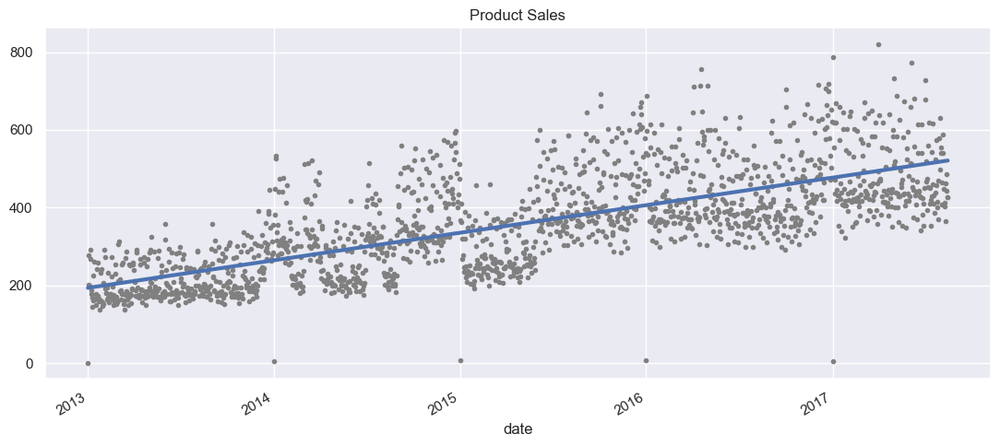

In [103]:
bx = average_sales['sales'].plot(style=".", color="0.5", title="Product Sales")
by = y2_fore.plot(ax=bx, linewidth=3, label="Trend")


# Data Modelling

Let's now choose the factors for our model. According to our analysis:

- Sales are influenced by:
  - Day of the week (with weekends indicating higher sales).
  - Month of the year (with stronger sales typically seen in October to December).
  - Oil prices (sales tend to increase when oil prices are low, and vice versa).
  - Promotions (more promotions usually lead to higher se sales.

### Fitting the Model

In [104]:
# replacing NAN values with the interpolated values
values = df_oil['dcoilwtico'].values
values

array([93.14, 93.14, 92.97, ..., 46.46, 45.96, 47.26])

In [105]:
indices_nan = np.isnan(values)
indices_nan

array([False, False, False, ..., False, False, False])

In [106]:
# Get indices where values are not NaN
indices_not_nan = ~indices_nan

# Linearly interpolate NaN values
interpolated_values = np.interp(np.arange(len(values)), 
                                 indices_not_nan.nonzero()[0], 
                                 values[indices_not_nan])

# NaN values are replaced with interpolated values
values[indices_nan] = interpolated_values[indices_nan]

# interpolated column is used to update the DataFrame 
df_oil['dcoilwtico'] = values

In [107]:
df_oil = df_oil.drop(columns = 'interpolated_dcoilwtico')

In [108]:
df_oil

,date,dcoilwtico
0,2013-01-01,93.14
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [109]:
# import libraries

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder

from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error
import warnings
warnings.filterwarnings("ignore")


In [110]:
oil_data_copy = df_oil.copy()
oil_data_copy

,date,dcoilwtico
0,2013-01-01,93.14
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [111]:
# training data and interpolated oil dataset are merged together
df_train = pd.merge(df_train, oil_data_copy, how='inner', on='date')
df_train


,date,id,store_nbr,family,sales,onpromotion,day_of_week,Day of Week,Day Name,Month,Year,dcoilwtico
0,2013-01-01,0,1,AUTOMOTIVE,0.000,0,Tuesday,1,Tuesday,1,2013,93.14
1,2013-01-01,1,1,BABY CARE,0.000,0,Tuesday,1,Tuesday,1,2013,93.14
2,2013-01-01,2,1,BEAUTY,0.000,0,Tuesday,1,Tuesday,1,2013,93.14
3,2013-01-01,3,1,BEVERAGES,0.000,0,Tuesday,1,Tuesday,1,2013,93.14
4,2013-01-01,4,1,BOOKS,0.000,0,Tuesday,1,Tuesday,1,2013,93.14
...,...,...,...,...,...,...,...,...,...,...,...,...
2143741,2017-08-15,3000883,9,POULTRY,438.133,0,Tuesday,1,Tuesday,8,2017,47.57
2143742,2017-08-15,3000884,9,PREPARED FOODS,154.553,1,Tuesday,1,Tuesday,8,2017,47.57
2143743,2017-08-15,3000885,9,PRODUCE,2419.729,148,Tuesday,1,Tuesday,8,2017,47.57
2143744,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Tuesday,1,Tuesday,8,2017,47.57


In [112]:
df_train

,date,id,store_nbr,family,sales,onpromotion,day_of_week,Day of Week,Day Name,Month,Year,dcoilwtico
0,2013-01-01,0,1,AUTOMOTIVE,0.000,0,Tuesday,1,Tuesday,1,2013,93.14
1,2013-01-01,1,1,BABY CARE,0.000,0,Tuesday,1,Tuesday,1,2013,93.14
2,2013-01-01,2,1,BEAUTY,0.000,0,Tuesday,1,Tuesday,1,2013,93.14
3,2013-01-01,3,1,BEVERAGES,0.000,0,Tuesday,1,Tuesday,1,2013,93.14
4,2013-01-01,4,1,BOOKS,0.000,0,Tuesday,1,Tuesday,1,2013,93.14
...,...,...,...,...,...,...,...,...,...,...,...,...
2143741,2017-08-15,3000883,9,POULTRY,438.133,0,Tuesday,1,Tuesday,8,2017,47.57
2143742,2017-08-15,3000884,9,PREPARED FOODS,154.553,1,Tuesday,1,Tuesday,8,2017,47.57
2143743,2017-08-15,3000885,9,PRODUCE,2419.729,148,Tuesday,1,Tuesday,8,2017,47.57
2143744,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Tuesday,1,Tuesday,8,2017,47.57


In [113]:
df_train['weekend'] = df_train['Day of Week'].isin([5, 6]).astype(int)
df_train.drop(columns=['date', 'Day Name', 'store_nbr', 'Year'], axis=1, inplace=True)

In [114]:
df_train

,id,family,sales,onpromotion,day_of_week,Day of Week,Month,dcoilwtico,weekend
0,0,AUTOMOTIVE,0.000,0,Tuesday,1,1,93.14,0
1,1,BABY CARE,0.000,0,Tuesday,1,1,93.14,0
2,2,BEAUTY,0.000,0,Tuesday,1,1,93.14,0
3,3,BEVERAGES,0.000,0,Tuesday,1,1,93.14,0
4,4,BOOKS,0.000,0,Tuesday,1,1,93.14,0
...,...,...,...,...,...,...,...,...,...
2143741,3000883,POULTRY,438.133,0,Tuesday,1,8,47.57,0
2143742,3000884,PREPARED FOODS,154.553,1,Tuesday,1,8,47.57,0
2143743,3000885,PRODUCE,2419.729,148,Tuesday,1,8,47.57,0
2143744,3000886,SCHOOL AND OFFICE SUPPLIES,121.000,8,Tuesday,1,8,47.57,0


### Prepare test data

In [115]:
df_test['Day of Week'] = df_test['date'].dt.dayofweek
df_test['Day Name'] = df_test['date'].dt.day_name()
df_test['Month'] = pd.to_datetime(df_test['date'], format = '%m').dt.month
df_test['Year'] = pd.to_datetime(df_test['date'], format='%Y').dt.year


In [116]:
df_test = pd.merge(df_test, oil_data_copy, how='inner', on='date')
df_test

,id,date,store_nbr,family,onpromotion,Day of Week,Day Name,Month,Year,dcoilwtico
0,3000888,2017-08-16,1,AUTOMOTIVE,0,2,Wednesday,8,2017,46.80
1,3000889,2017-08-16,1,BABY CARE,0,2,Wednesday,8,2017,46.80
2,3000890,2017-08-16,1,BEAUTY,2,2,Wednesday,8,2017,46.80
3,3000891,2017-08-16,1,BEVERAGES,20,2,Wednesday,8,2017,46.80
4,3000892,2017-08-16,1,BOOKS,0,2,Wednesday,8,2017,46.80
...,...,...,...,...,...,...,...,...,...,...
21379,3029395,2017-08-31,9,POULTRY,1,3,Thursday,8,2017,47.26
21380,3029396,2017-08-31,9,PREPARED FOODS,0,3,Thursday,8,2017,47.26
21381,3029397,2017-08-31,9,PRODUCE,1,3,Thursday,8,2017,47.26
21382,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9,3,Thursday,8,2017,47.26


In [117]:
df_test['weekend'] = df_test['Day of Week'].isin([5, 6]).astype(int)


In [118]:
df_test

,id,date,store_nbr,family,onpromotion,Day of Week,Day Name,Month,Year,dcoilwtico,weekend
0,3000888,2017-08-16,1,AUTOMOTIVE,0,2,Wednesday,8,2017,46.80,0
1,3000889,2017-08-16,1,BABY CARE,0,2,Wednesday,8,2017,46.80,0
2,3000890,2017-08-16,1,BEAUTY,2,2,Wednesday,8,2017,46.80,0
3,3000891,2017-08-16,1,BEVERAGES,20,2,Wednesday,8,2017,46.80,0
4,3000892,2017-08-16,1,BOOKS,0,2,Wednesday,8,2017,46.80,0
...,...,...,...,...,...,...,...,...,...,...,...
21379,3029395,2017-08-31,9,POULTRY,1,3,Thursday,8,2017,47.26,0
21380,3029396,2017-08-31,9,PREPARED FOODS,0,3,Thursday,8,2017,47.26,0
21381,3029397,2017-08-31,9,PRODUCE,1,3,Thursday,8,2017,47.26,0
21382,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9,3,Thursday,8,2017,47.26,0


In [119]:
df_test.drop(columns=['date', 'Day Name', 'store_nbr', 'Year'], axis=1, inplace=True)

In [120]:
label=LabelEncoder()
df_train.family = label.fit_transform(df_train.family)
df_train.head()

,id,family,sales,onpromotion,day_of_week,Day of Week,Month,dcoilwtico,weekend
0,0,0,0.0,0,Tuesday,1,1,93.14,0
1,1,1,0.0,0,Tuesday,1,1,93.14,0
2,2,2,0.0,0,Tuesday,1,1,93.14,0
3,3,3,0.0,0,Tuesday,1,1,93.14,0
4,4,4,0.0,0,Tuesday,1,1,93.14,0


In [121]:
df_train.drop(columns=['day_of_week'], axis=1, inplace=True)

In [122]:
label=LabelEncoder()
df_test.family = label.fit_transform(df_test.family)
df_test.head()

,id,family,onpromotion,Day of Week,Month,dcoilwtico,weekend
0,3000888,0,0,2,8,46.8,0
1,3000889,1,0,2,8,46.8,0
2,3000890,2,2,2,8,46.8,0
3,3000891,3,20,2,8,46.8,0
4,3000892,4,0,2,8,46.8,0


In [123]:
X = df_train.drop(['sales'], axis=1)
y = df_train['sales'] #target

In [124]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [125]:
from sklearn.metrics import r2_score

# initializing the linear regression model and fitting the data 
model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print('RMSE: ', rmse)
print('MSE: ', mse)
print('R2: ', r2)

RMSE:  878.2110119507249
MSE:  771254.5815115164
R2:  0.20711332294871565


In [126]:
df_train['sales'].describe()


count    2.143746e+06
mean     3.216291e+02
std      9.707549e+02
min      0.000000e+00
25%      0.000000e+00
50%      1.000000e+01
75%      1.800000e+02
max      1.247170e+05
Name: sales, dtype: float64

In [127]:
# getting the score on the testing data 
print(str(model.score(X_test, y_test))) 

# getting the score on the training data
print(str(model.score(X_train, y_train))) 

0.20711332294871565
0.21937374457527836


#### Hyperparameter tuning 

In [128]:
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error



* The pipeline first scales the features using StandardScaler and then fits a Ridge regression model to the scaled data.

In [129]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', Ridge())
])


* Hyperparameters to tune

In [130]:
parameters = {
    'regressor__alpha': [0.1, 1, 10, 100],
    'regressor__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
}


In [131]:
# Initialize the GridSearchCV object
grid_search = GridSearchCV(pipeline, parameters, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Calculating values for Best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score (MSE):", -grid_search.best_score_)

Best parameters: {'regressor__alpha': 0.1, 'regressor__solver': 'sag'}
Best score (MSE): 729768.5559850216


In [132]:
# Predicting and evaluate the model performance
y_pred = grid_search.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Test MSE:", mse)

Test MSE: 771254.2020951579


In [133]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#### XGBoost

In [134]:
# intializing and fitting data into the XGBRegressor model
xg_reg = xgb.XGBRegressor(n_estimators = 300, max_depth = 9)
xg_reg.fit(X_train, y_train)

y_pred = xg_reg.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print('RMSE: ', rmse)

RMSE:  569.1585291135297


In [135]:
# calculating r2 score 
r2 = r2_score(y_test, y_pred)

print('R2: ', r2)

R2:  0.6669726817185002


In [136]:
print(str(xg_reg.score(X_test, y_test)))

print(str(xg_reg.score(X_train, y_train)))

0.6669726817185002
0.7700800570471231


In [137]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
import numpy as np

# Load your data here
# X, y = ...

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Instantiate an XGBoost regressor object
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror')

# Define the hyperparameters to tune
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9]
}


In [138]:
# sampling the dataframe as it is utilizing computational resources
X_train_top_one = X_train.iloc[:300000]
y_train_top_one = y_train.iloc[:300000]

In [139]:
# Set up GridSearchCV
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')

# Fit the grid search model
grid_search.fit(X_train_top_one, y_train_top_one)

# Get the best parameters and calculate RMSE
best_params = grid_search.best_params_
best_score = np.sqrt(-grid_search.best_score_)

print("Best Parameters:", best_params)
print("Best RMSE:", best_score)




Best Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 300, 'subsample': 0.9}
Best RMSE: 574.8458600623507


In [140]:
r2 = r2_score(y_test, y_pred)
print('R2: ', r2)

R2:  0.6669726817185002


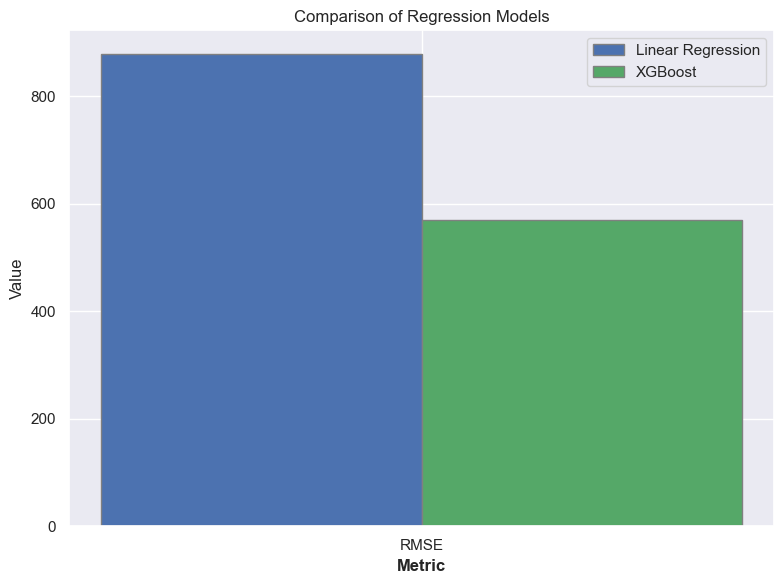

In [141]:
import matplotlib.pyplot as plt
import numpy as np

# Example metric values from your model evaluation
# Replace these with your actual metrics after running your models
lr_rmse = 878.2110119507249  # Example RMSE for Linear Regression
lr_r2 = 0.60   # Example R² for Linear Regression
xgb_rmse = 569.1585291135297 # Example RMSE for XGBoost
xgb_r2 = 0.70  # Example R² for XGBoost

# Labels for the groups
metric_labels = ['RMSE']

# Values as lists
lr_metrics = [lr_rmse]
xgb_metrics = [xgb_rmse]

# Set position of bar on X axis
r1 = np.arange(len(lr_metrics))
r2 = [x + 0.3 for x in r1]

# Make the plot
plt.figure(figsize=(8, 6))
plt.bar(r1, lr_metrics, color='b', width=0.3, edgecolor='grey', label='Linear Regression')
plt.bar(r2, xgb_metrics, color='g', width=0.3, edgecolor='grey', label='XGBoost')

# Add xticks on the middle of the group bars
plt.xlabel('Metric', fontweight='bold')
plt.xticks([r + 0.15 for r in range(len(lr_metrics))], metric_labels)
plt.ylabel('Value')
plt.title('Comparison of Regression Models')

# Create legend & Show graphic
plt.legend()
plt.show()

XGBRegressor performs a lot better than linear regression, with RMSE of 633.47 compared with 999.15. However, just one test score is not reliable so we will also use k-fold cross-validation.

### RANDOM FOREST

In [142]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor

# Use a subset of the data for quicker execution
X_train_sample = X_train.sample(frac=0.1, random_state=42)
y_train_sample = y_train.loc[X_train_sample.index]

# Instantiate a Random Forest Regressor
rf_reg = RandomForestRegressor()

# Define a smaller hyperparameters grid
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

# Use RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=rf_reg, param_distributions=param_grid,
                                   n_iter=10, cv=3, scoring='neg_mean_squared_error',
                                   n_jobs=-1, verbose=2, random_state=42)

# Fit the model
random_search.fit(X_train_sample, y_train_sample)

# Extract the best parameters and calculate RMSE
best_params = random_search.best_params_
best_score = np.sqrt(-random_search.best_score_)

print("Best Parameters:", best_params)
print("Best RMSE:", best_score)

# For final model evaluation, consider refitting the best model on the full training set


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  44.2s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time= 1.3min
Best Parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': 10}
Best RMSE: 596.9596085145322


In [143]:


# Select the top 100000 rows from your training data
X_train_top = X_train.iloc[:100000]
y_train_top = y_train.iloc[:100000]




In [144]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np

# Assuming X_train, X_test, y_train, and y_test are already defined

# Instantiate a Random Forest Regressor
rf_reg = RandomForestRegressor()

# Define the hyperparameters to tune
# Note: The choice of parameters and ranges should be tailored to your dataset and specific needs
param_grid_rf = {
    'n_estimators': [50, 100],  # Reduced number of trees
    'max_depth': [None, 10],    # Reduced maximum depth options
    'min_samples_split': [2, 5],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2]     # Minimum number of samples required to be at a leaf node
}

# Set up GridSearchCV for the Random Forest Regressor
grid_search_rf = GridSearchCV(estimator=rf_reg, param_grid=param_grid_rf, cv=3, scoring='neg_mean_squared_error')

# Fit the grid search model
grid_search_rf.fit(X_train_top, y_train_top)

# Get the best parameters and calculate RMSE
best_params_rf = grid_search_rf.best_params_
best_score_rf = np.sqrt(-grid_search_rf.best_score_)

print("Best Parameters (Random Forest):", best_params_rf)
print("Best RMSE (Random Forest):", best_score_rf)


[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time= 1.3min
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=  44.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  46.3s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  46.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time= 1.4min
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  44.8s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  41.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  44.5s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=  20.9s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=100; t

## DECISION TREE

In [145]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
import numpy as np

# Assuming X_train, X_test, y_train, and y_test are already defined

# Instantiate a Decision Tree Regressor with default parameters
dt_model = DecisionTreeRegressor()

# Fit the model to the training data
dt_model.fit(X_train, y_train)

# Make predictions using the model on the test data
y_pred = dt_model.predict(X_test)

# Calculate the RMSE between the actual and predicted values
rmse_dt = np.sqrt(mean_squared_error(y_test, y_pred))

# Print the RMSE
print("RMSE (Decision Tree):", rmse_dt)


RMSE (Decision Tree): 694.6151607317927


In [146]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np

# Assuming X_train and y_train are already defined

# Instantiate a Decision Tree Regressor
dt_model = DecisionTreeRegressor()

# Define the hyperparameters grid to be tuned
param_grid_dt = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'auto', 'sqrt', 'log2']
}

# Set up GridSearchCV
grid_search_dt = GridSearchCV(estimator=dt_model, param_grid=param_grid_dt, cv=10, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)

# Fit the grid search model
grid_search_dt.fit(X_train_top, y_train_top)

# Extract the best parameters
best_params_dt = grid_search_dt.best_params_
best_score_dt = np.sqrt(-grid_search_dt.best_score_)

print("Best Parameters (Decision Tree):", best_params_dt)
print("Best RMSE (Decision Tree):", best_score_dt)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Parameters (Decision Tree): {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 10}
Best RMSE (Decision Tree): 586.2663201218494


# Cross-validation

K-fold cross-validation involves dividing the test data into k subsets (or folds), using each subset as a test set while the rest serve as training sets. Scores are then averaged across these iterations. Though training sets may overlap, test sets remain distinct. Additionally, we'll employ cross_val_score for score evaluation.

### Cross-Validation with linear regression

In [147]:
model = LinearRegression()

# Utilize cross_val_score with the models, where the number of folds is determined by the variable cv.

scores = cross_val_score(model, X_train, y_train, scoring='neg_mean_squared_error', cv=10)

rmse_cv_lr = np.sqrt(-scores)
print('Reg. rmse (Linear Regression Model): ', np.round(rmse_cv_lr, 2))
print('RMSE mean (Linear Regression Model)): %0.2f' % (rmse_cv_lr.mean()))

Reg. rmse (Linear Regression Model):  [851.28 866.88 872.08 834.81 847.04 853.35 881.28 847.7  832.95 853.93]
RMSE mean (Linear Regression Model)): 854.13


### Cross-validation with XGBoost

In [148]:
model = xgb.XGBRegressor()

# Utilize cross_val_score with the models, where the number of folds is determined by the variable cv.

scores = cross_val_score(model, X_train, y_train, scoring='neg_mean_squared_error', cv=10)

rmse_cv = np.sqrt(-scores)
print('Reg. rmse (XGBoost Model): ', np.round(rmse_cv, 2))
print('RMSE mean (XGBoost Model): %0.2f' % (rmse_cv.mean()))

Reg. rmse (XGBoost Model):  [537.29 563.92 548.59 521.14 530.2  534.17 576.03 530.63 514.67 533.04]
RMSE mean (XGBoost Model): 538.97


In [149]:
y_pred_test = xg_reg.predict(df_test)
y_pred_test

array([  2.2764862,  -3.3601167,  26.234516 , ..., 656.8319   ,
       289.12708  ,   1.5918181], dtype=float32)

### Cross-Validation with Random Forest

In [150]:
# Select the top 100000 rows from your training data
X_train_top_top = X_train.iloc[:300000]
y_train_top_top = y_train.iloc[:300000]

In [151]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
import numpy as np

# Instantiate a Random Forest Regressor
rf_model = RandomForestRegressor()

# Perform cross-validation and calculate RMSE
rf_scores = cross_val_score(rf_model, X_train_top_top, y_train_top_top, scoring='neg_mean_squared_error', cv=10)

rf_rmse_cv = np.sqrt(-rf_scores)
print('Reg. rmse (Random Forest Model): ', np.round(rf_rmse_cv, 2))
print('RMSE mean (Random Forest Model): %0.2f' % (rf_rmse_cv.mean()))

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=   0.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   0.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=   0.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=   0.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=   0.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=   0.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=   0.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=   0.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=   0.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=   0.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=   0.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=   0.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4

Reg. rmse (Random Forest Model):  [638.49 611.82 659.62 588.95 567.88 599.16 543.64 760.65 566.04 561.07]
RMSE mean (Random Forest Model): 609.73



### Cross-Validation with DecisionTree


In [152]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
import numpy as np

# Assuming X_train and y_train are already defined

# Instantiate a Decision Tree Regressor
dt_model = DecisionTreeRegressor()

# Perform cross-validation and calculate RMSE
dt_scores = cross_val_score(dt_model, X_train_top_top, y_train_top_top, scoring='neg_mean_squared_error', cv=10)

dt_rmse_cv = np.sqrt(-dt_scores)
print('Reg. rmse (Decision Tree Model): ', np.round(dt_rmse_cv, 2))
print('RMSE mean (Decision Tree Model): %0.2f' % (dt_rmse_cv.mean()))


Reg. rmse (Decision Tree Model):  [851.77 745.43 860.64 729.43 735.09 739.64 673.62 866.9  707.57 702.82]
RMSE mean (Decision Tree Model): 761.29


After assessing the ML models, it's evident that the XGBoost ML model yields a notably lower RMSE value, indicating its capability to generate more dependable predictions.

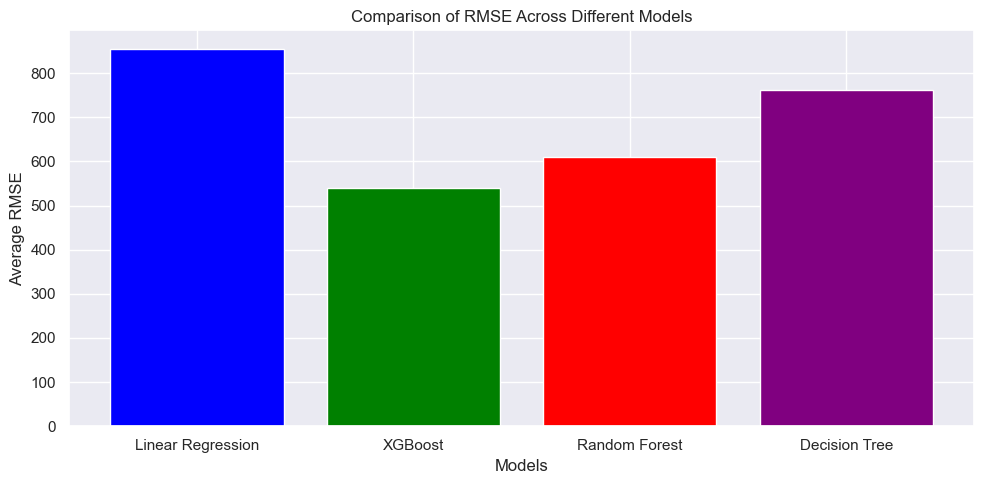

In [153]:
import matplotlib.pyplot as plt

# Assume rmse_cv_lr, rmse_cv, rf_rmse_cv, and dt_rmse_cv are arrays containing the RMSE values for each fold
# and have been calculated from previous code executions.

# Calculate the mean RMSE for each model
rmse_means = [
    np.mean(rmse_cv_lr),
    np.mean(rmse_cv),
    np.mean(rf_rmse_cv),
    np.mean(dt_rmse_cv)
]

# Names of models
models = ['Linear Regression', 'XGBoost', 'Random Forest', 'Decision Tree']

# Create the bar plot
plt.figure(figsize=(10, 5))
plt.bar(models, rmse_means, color=['blue', 'green', 'red', 'purple'])

# Add title and labels to the plot
plt.title('Comparison of RMSE Across Different Models')
plt.xlabel('Models')
plt.ylabel('Average RMSE')

# Display the plot
plt.show()


The bar chart compares the average RMSE (Root Mean Squared Error) for four different regression models: Linear Regression, XGBoost, Random Forest, and Decision Tree. The lower the RMSE, the better the model's performance in terms of prediction accuracy.

From the chart, it seems that the XGBoost model has the lowest average RMSE, making it the best performer among the four models for this particular dataset and metric. The high RMSE for Linear Regression indicates it may not be capturing the complexity of the dataset as well as the other models. The Random Forest and Decision Tree models have higher RMSEs than XGBoost but lower than Linear Regression, placing them in between the two in terms of performance.

In [155]:
data = df_test
data['Predicted Sales'] = y_pred_test

In [156]:
data['Predicted Sales'].describe()

count    21384.000000
mean       395.480743
std       1024.799561
min       -904.807007
25%          6.569231
50%         32.257904
75%        304.488678
max      11364.195312
Name: Predicted Sales, dtype: float64

In [157]:
data[data['Predicted Sales'] < 0]

,id,family,onpromotion,Day of Week,Month,dcoilwtico,weekend,Predicted Sales
1,3000889,1,0,2,8,46.80,0,-3.360117
4,3000892,4,0,2,8,46.80,0,-6.566324
31,3000919,31,14,2,8,46.80,0,-121.062431
34,3000922,1,0,2,8,46.80,0,-3.360117
37,3000925,4,0,2,8,46.80,0,-6.566324
...,...,...,...,...,...,...,...,...
21316,3029332,31,0,3,8,47.26,0,-16.178326
21317,3029333,32,1,3,8,47.26,0,-11.620466
21334,3029350,16,3,3,8,47.26,0,-4.249269
21349,3029365,31,0,3,8,47.26,0,-16.178326


In [158]:
#setting any negative values in the dataframe to zero
data.loc[data['Predicted Sales'] < 0, 'Predicted Sales'] = 0

In [159]:
data

,id,family,onpromotion,Day of Week,Month,dcoilwtico,weekend,Predicted Sales
0,3000888,0,0,2,8,46.80,0,2.276486
1,3000889,1,0,2,8,46.80,0,0.000000
2,3000890,2,2,2,8,46.80,0,26.234516
3,3000891,3,20,2,8,46.80,0,1224.744263
4,3000892,4,0,2,8,46.80,0,0.000000
...,...,...,...,...,...,...,...,...
21379,3029395,28,1,3,8,47.26,0,202.160477
21380,3029396,29,0,3,8,47.26,0,85.497261
21381,3029397,30,1,3,8,47.26,0,656.831909
21382,3029398,31,9,3,8,47.26,0,289.127075


UTILIZING XGBOOST FOR THE PREDICTION AND WE GET THE OUTPUT AS SHOWN ABOVE